images_2k 数量: 20000
overlay 数量: 19972
cond 数量: 19972
三个文件夹共有的 PNG 数量: 19972


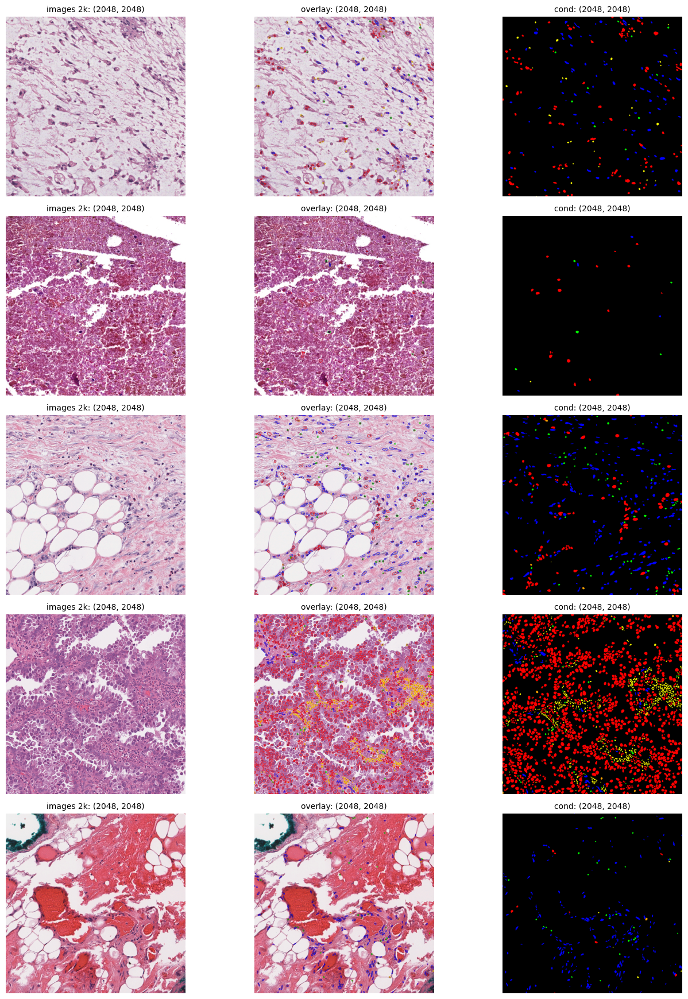

In [1]:
import os
import random
from PIL import Image
import matplotlib.pyplot as plt

# 定义路径
folder_images_2k = "/data06/shared/xxu/miccai2025/color_to_HR/tcga_text_to_image_larger/other_data/pathgen_4k/images_2k"
folder_overlay = "/data06/shared/xxu/miccai2025/color_to_HR/tcga_text_to_image_larger/other_data/pathgen_4k_segmentation/pathgen_2k_images_hovernet_pannuke/overlay"
folder_cond = "/data07/shared/xxu/cvpr/may07/pathgen/pathgen_2k_hovernet_pannuke"

# 获取每个文件夹中的 PNG 文件名
images_2k_files = set(f for f in os.listdir(folder_images_2k) if f.endswith('.png'))
overlay_files = set(f for f in os.listdir(folder_overlay) if f.endswith('.png'))
cond_files = set(f for f in os.listdir(folder_cond) if f.endswith('.png'))

# 输出每个文件夹中 PNG 数量
print("images_2k 数量:", len(images_2k_files))
print("overlay 数量:", len(overlay_files))
print("cond 数量:", len(cond_files))

# 找到同时存在于三个文件夹的文件名
common_files = images_2k_files & overlay_files & cond_files
print("三个文件夹共有的 PNG 数量:", len(common_files))

# 随机选取5个共同文件名
selected_files = random.sample(list(common_files), min(5, len(common_files)))

# 绘图
plt.figure(figsize=(14, 3.5 * len(selected_files)))
for i, fname in enumerate(selected_files):
    img_2k = Image.open(os.path.join(folder_images_2k, fname))
    img_overlay = Image.open(os.path.join(folder_overlay, fname))
    img_cond = Image.open(os.path.join(folder_cond, fname))

    for j, (img, label) in enumerate(zip(
        [img_2k, img_overlay, img_cond],
        ["images 2k", "overlay", "cond"]
    )):
        plt.subplot(len(selected_files), 3, i * 3 + j + 1)
        plt.imshow(img)
        plt.axis('off')
        size_str = f"{label}: {img.size}"  # PIL uses (width, height)
        plt.title(size_str, fontsize=10)
plt.tight_layout()
plt.show()


In [2]:

import json

# 路径设置
jsonl_path = "/data07/shared/xxu/cvpr/may07/pathgen/prompt.jsonl"  # 替换为你的 jsonl 文件路径
data = []

# 读取 JSONL 文件
with open(jsonl_path, "r") as f:
    for line in f:
        item = json.loads(line.strip())  # 每行解析为字典
        data.append(item)

# 示例：打印前3条
for item in data[:3]:
    print(item)

{'source': '/data07/shared/xxu/cvpr/may07/pathgen/pathgen_2k_hovernet_pannuke_512/TCGA-K4-A5RJ-01Z-00-DX1.DFDDA8B5-E80F-4BF9-87E3-EA75E294ABF5_42496_51168.png', 'target': '/data06/shared/xxu/miccai2025/color_to_HR/tcga_text_to_image_larger/other_data/pathgen_4k/images_2k/TCGA-K4-A5RJ-01Z-00-DX1.DFDDA8B5-E80F-4BF9-87E3-EA75E294ABF5_42496_51168.png', 'prompt': 'The histological section of bladder tissue exhibits normal features, including glandular structures with luminal spaces lined by transitional epithelium, surrounded by connective tissue stroma, fibroblasts, and collagenous matrix. Adipose tissue is also present. No signs of malignancy or significant pathology are observed, indicating a normal bladder morphology with no abnormal findings.'}
{'source': '/data07/shared/xxu/cvpr/may07/pathgen/pathgen_2k_hovernet_pannuke_512/TCGA-B5-A3F9-01Z-00-DX1.1A9F6606-71D0-45C4-84BF-D3F8F07E0732_13760_48800.png', 'target': '/data06/shared/xxu/miccai2025/color_to_HR/tcga_text_to_image_larger/other

In [5]:
jsonl_path = '/data07/shared/xxu/cvpr/may07/dataset_custom/prompt.jsonl'

data = []

# 读取 JSONL 文件
with open(jsonl_path, "r") as f:
    for line in f:
        item = json.loads(line.strip())  # 每行解析为字典
        data.append(item)

# 示例：打印前3条
for item in data[:3]:
    print(item)

{'source': 'source/TCGA-B6-A0WS-01Z-00-DX1.020ED7BF-9497-4F13-AA07-FE0E839F9A06_99936_25280.png', 'target': 'target/TCGA-B6-A0WS-01Z-00-DX1.020ED7BF-9497-4F13-AA07-FE0E839F9A06_99936_25280.png', 'prompt': 'The breast tissue image shows fibrocystic changes characterized by a dense, pink collagenous stroma and a cribriform pattern. There is epithelial hyperplasia without visible cysts. These findings suggest fibrocystic disease, indicated by fibrosis and architectural distortion, but no signs of malignancy are present. The diagnosis aligns with typical fibrocystic breast pathology.'}
{'source': 'source/TCGA-EB-A3XC-01Z-00-DX1.F50679D7-D525-4F20-980F-AF43D7E9EBE6_35968_14208.png', 'target': 'target/TCGA-EB-A3XC-01Z-00-DX1.F50679D7-D525-4F20-980F-AF43D7E9EBE6_35968_14208.png', 'prompt': 'The skin tissue image reveals atypical, pleomorphic cells with high nuclear-to-cytoplasmic ratios and hyperchromatic nuclei, indicative of malignancy. Disrupted tissue architecture and absence of normal st

In [8]:
jsonl_path = '/data07/shared/xxu/cvpr/may07/dataset_custom/prompt_no_prompt.jsonl'

data = []

# 读取 JSONL 文件
with open(jsonl_path, "r") as f:
    for line in f:
        item = json.loads(line.strip())  # 每行解析为字典
        data.append(item)

# 示例：打印前3条
for item in data[:3]:
    print(item)

{'source': 'source/TCGA-B6-A0WS-01Z-00-DX1.020ED7BF-9497-4F13-AA07-FE0E839F9A06_99936_25280.png', 'target': 'target/TCGA-B6-A0WS-01Z-00-DX1.020ED7BF-9497-4F13-AA07-FE0E839F9A06_99936_25280.png', 'prompt': ''}
{'source': 'source/TCGA-EB-A3XC-01Z-00-DX1.F50679D7-D525-4F20-980F-AF43D7E9EBE6_35968_14208.png', 'target': 'target/TCGA-EB-A3XC-01Z-00-DX1.F50679D7-D525-4F20-980F-AF43D7E9EBE6_35968_14208.png', 'prompt': ''}
{'source': 'source/TCGA-B6-A0IO-01Z-00-DX1.D8898C30-4016-4983-9359-5C1507C01715_10016_26368.png', 'target': 'target/TCGA-B6-A0IO-01Z-00-DX1.D8898C30-4016-4983-9359-5C1507C01715_10016_26368.png', 'prompt': ''}


In [6]:
import json

# 原始文件路径
jsonl_path = '/data07/shared/xxu/cvpr/may07/dataset_custom/prompt.jsonl'
# 新文件保存路径
new_jsonl_path = '/data07/shared/xxu/cvpr/may07/dataset_custom/prompt_no_prompt.jsonl'

data = []

# 读取原始 JSONL 并修改 prompt 字段
with open(jsonl_path, "r") as f:
    for line in f:
        item = json.loads(line.strip())
        item['prompt'] = ""  # 清空 prompt
        data.append(item)

# 保存为新的 JSONL 文件
with open(new_jsonl_path, "w") as f:
    for item in data:
        f.write(json.dumps(item) + "\n")

print(f"Modified JSONL saved to {new_jsonl_path}")


Modified JSONL saved to /data07/shared/xxu/cvpr/may07/dataset_custom/prompt_no_prompt.jsonl


In [3]:
len(data)

19972

In [4]:
data[244]

{'source': '/data07/shared/xxu/cvpr/may07/pathgen/pathgen_2k_hovernet_pannuke_512/TCGA-CM-5868-01Z-00-DX1.70f2e193-248d-4bf9-a875-49c314223f70_103488_44832.png',
 'target': '/data06/shared/xxu/miccai2025/color_to_HR/tcga_text_to_image_larger/other_data/pathgen_4k/images_2k/TCGA-CM-5868-01Z-00-DX1.70f2e193-248d-4bf9-a875-49c314223f70_103488_44832.png',
 'prompt': 'The colon tissue image displays crowded epithelial cells with nuclear atypia, including enlarged hyperchromatic nuclei and prominent nucleoli. Glandular architecture is disrupted, with glands packed tightly without stroma, indicating neoplasia. High mitotic activity and desmoplastic stroma suggest invasive tumor growth. These features are consistent with a diagnosis of well-differentiated adenocarcinoma of the colon.'}

In [31]:
data_files= [item['source'].split('/')[-1] for item in data]

In [35]:
len(set(data_files).union(common_files))

19972

In [37]:
'TCGA-E3-A3E5-01Z-00-DX1.E7E8AB8B-695F-4158-A3C0-E2B801E07D2A96_81760.png' in common_files

False

In [38]:
'TCGA-E3-A3E5-01Z-00-DX1.E7E8AB8B-695F-4158-A3C0-E2B801E07D2A96_81760.png' in data_files

False

In [39]:
import os

file_list = [
    data[244]['source'].replace('_512',''),
    data[244]['target'],
    data[245]['source'].replace('_512',''),
    data[245]['target'],
    data[249]['source'].replace('_512',''),
    data[249]['target']
    
]

for path in file_list:
    if not os.path.exists(path):
        print("❌ Missing:", path)
    else:
        print("✅ Found:", path)

✅ Found: /data07/shared/xxu/cvpr/may07/pathgen/pathgen_2k_hovernet_pannuke/TCGA-CM-5868-01Z-00-DX1.70f2e193-248d-4bf9-a875-49c314223f70_103488_44832.png
✅ Found: /data06/shared/xxu/miccai2025/color_to_HR/tcga_text_to_image_larger/other_data/pathgen_4k/images_2k/TCGA-CM-5868-01Z-00-DX1.70f2e193-248d-4bf9-a875-49c314223f70_103488_44832.png
❌ Missing: /data07/shared/xxu/cvpr/may07/pathgen/pathgen_2k_hovernet_pannuke/TCGA-E3-A3E5-01Z-00-DX1.E7E8AB8B-695F-4158-A3C0-E2B801E07D2A96_81760.png
✅ Found: /data06/shared/xxu/miccai2025/color_to_HR/tcga_text_to_image_larger/other_data/pathgen_4k/images_2k/TCGA-E3-A3E5-01Z-00-DX1.E7E8AB8B-695F-4158-A3C0-E2B801E07D2A_51296_81760.png
❌ Missing: /data07/shared/xxu/cvpr/may07/pathgen/pathgen_2k_hovernet_pannuke/TCGA-P4-AAVL-01Z-00-DX1.6A86A318-057A-468D-826E-3B5C8B22426664_52832.png
✅ Found: /data06/shared/xxu/miccai2025/color_to_HR/tcga_text_to_image_larger/other_data/pathgen_4k/images_2k/TCGA-P4-AAVL-01Z-00-DX1.6A86A318-057A-468D-826E-3B5C8B224266_5126

In [43]:
data[249]['source'].replace('_512/','/').split('/')[-1] in common_files

True

In [11]:
import os
import json
import cv2
from tqdm import tqdm

# 输入 jsonl 路径
jsonl_path = "/data07/shared/xxu/cvpr/may07/pathgen/prompt.jsonl"

# 输出目录
output_img_dir = "/data07/shared/xxu/cvpr/may07/data_2k/patches_from_jsonl/images_512"
output_cond_dir = "/data07/shared/xxu/cvpr/may07/data_2k/patches_from_jsonl/nuclei_512"
output_prompt_dir = "/data07/shared/xxu/cvpr/may07/data_2k/patches_from_jsonl/prompts"
os.makedirs(output_img_dir, exist_ok=True)
os.makedirs(output_cond_dir, exist_ok=True)
os.makedirs(output_prompt_dir, exist_ok=True)

# patch 参数
patch_size = 512
stride = 256

def extract_patches(img, patch_size, stride):
    H, W = img.shape[:2]
    patches, coords = [], []
    for i in range(0, H - patch_size + 1, stride):
        for j in range(0, W - patch_size + 1, stride):
            patch = img[i:i+patch_size, j:j+patch_size]
            patches.append(patch)
            coords.append((i, j))
    return patches, coords

# 读取 jsonl 并处理
with open(jsonl_path, "r") as f:
    for line in tqdm(f, desc="Processing JSONL items"):
        item = json.loads(line.strip())
        source_path = item["source"].replace('_512','')
        target_path = item["target"]
        prompt = item["prompt"]

        base_name = os.path.splitext(os.path.basename(source_path))[0]  # 用 source 命名
        if os.path.exists(target_path) and os.path.exists(source_path):
            img = cv2.imread(target_path)
            cond = cv2.imread(source_path)

            if img is None or cond is None:
                print(f"Warning: Cannot read image {target_path} or {source_path}")
                continue

            img_patches, coords = extract_patches(img, patch_size, stride)
            cond_patches, _ = extract_patches(cond, patch_size, stride)

            for (i, j), img_patch, cond_patch in zip(coords, img_patches, cond_patches):
                patch_id = f"{base_name}_r{i}_c{j}"
                img_path_out = os.path.join(output_img_dir, f"{patch_id}.png")
                cond_path_out = os.path.join(output_cond_dir, f"{patch_id}.png")
                prompt_path_out = os.path.join(output_prompt_dir, f"{patch_id}.txt")

                cv2.imwrite(img_path_out, img_patch)
                cv2.imwrite(cond_path_out, cond_patch)
                with open(prompt_path_out, "w") as pf:
                    pf.write(prompt)
        else:
            print('not found')


Processing JSONL items: 246it [04:45,  1.22it/s][ WARN:0@632.827] global loadsave.cpp:248 findDecoder imread_('/data07/shared/xxu/cvpr/may07/pathgen/pathgen_2k_hovernet_pannuke/TCGA-E3-A3E5-01Z-00-DX1.E7E8AB8B-695F-4158-A3C0-E2B801E07D2A96_81760.png'): can't open/read file: check file path/integrity


Processing JSONL items: 250it [04:49,  1.19it/s][ WARN:0@636.887] global loadsave.cpp:248 findDecoder imread_('/data07/shared/xxu/cvpr/may07/pathgen/pathgen_2k_hovernet_pannuke/TCGA-P4-AAVL-01Z-00-DX1.6A86A318-057A-468D-826E-3B5C8B22426664_52832.png'): can't open/read file: check file path/integrity


Processing JSONL items: 273it [05:21,  1.18s/it]


KeyboardInterrupt: 

In [ ]:
Processing JSONL items: 246it [04:45,  1.22it/s][ WARN:0@632.827] global loadsave.cpp:248 findDecoder imread_('/data07/shared/xxu/cvpr/may07/pathgen/pathgen_2k_hovernet_pannuke/TCGA-E3-A3E5-01Z-00-DX1.E7E8AB8B-695F-4158-A3C0-E2B801E07D2A96_81760.png'): can't open/read file: check file path/integrity
Warning: Cannot read image /data06/shared/xxu/miccai2025/color_to_HR/tcga_text_to_image_larger/other_data/pathgen_4k/images_2k/TCGA-E3-A3E5-01Z-00-DX1.E7E8AB8B-695F-4158-A3C0-E2B801E07D2A_51296_81760.png or /data07/shared/xxu/cvpr/may07/pathgen/pathgen_2k_hovernet_pannuke_512/TCGA-E3-A3E5-01Z-00-DX1.E7E8AB8B-695F-4158-A3C0-E2B801E07D2A_51296_81760.png
Processing JSONL items: 250it [04:49,  1.19it/s][ WARN:0@636.887] global loadsave.cpp:248 findDecoder imread_('/data07/shared/xxu/cvpr/may07/pathgen/pathgen_2k_hovernet_pannuke/TCGA-P4-AAVL-01Z-00-DX1.6A86A318-057A-468D-826E-3B5C8B22426664_52832.png'): can't open/read file: check file path/integrity
Warning: Cannot read image /data06/shared/xxu/miccai2025/color_to_HR/tcga_text_to_image_larger/other_data/pathgen_4k/images_2k/TCGA-P4-AAVL-01Z-00-DX1.6A86A318-057A-468D-826E-3B5C8B224266_51264_52832.png or /data07/shared/xxu/cvpr/may07/pathgen/pathgen_2k_hovernet_pannuke_512/TCGA-P4-AAVL-01Z-00-DX1.6A86A318-057A-468D-826E-3B5C8B224266_51264_52832.png
Processing JSONL items: 273it [05:21,  1.18s/it]

In [14]:
import os

file_list = [
    "/data06/shared/xxu/miccai2025/color_to_HR/tcga_text_to_image_larger/other_data/pathgen_4k/images_2k/TCGA-E3-A3E5-01Z-00-DX1.E7E8AB8B-695F-4158-A3C0-E2B801E07D2A_51296_81760.png",
    "/data07/shared/xxu/cvpr/may07/pathgen/pathgen_2k_hovernet_pannuke/TCGA-E3-A3E5-01Z-00-DX1.E7E8AB8B-695F-4158-A3C0-E2B801E07D2A_51296_81760.png",
    "/data06/shared/xxu/miccai2025/color_to_HR/tcga_text_to_image_larger/other_data/pathgen_4k/images_2k/TCGA-P4-AAVL-01Z-00-DX1.6A86A318-057A-468D-826E-3B5C8B224266_51264_52832.png",
    "/data07/shared/xxu/cvpr/may07/pathgen/pathgen_2k_hovernet_pannuke/TCGA-P4-AAVL-01Z-00-DX1.6A86A318-057A-468D-826E-3B5C8B224266_51264_52832.png"
    
]

for path in file_list:
    if not os.path.exists(path):
        print("❌ Missing:", path)
    else:
        print("✅ Found:", path)

✅ Found: /data06/shared/xxu/miccai2025/color_to_HR/tcga_text_to_image_larger/other_data/pathgen_4k/images_2k/TCGA-E3-A3E5-01Z-00-DX1.E7E8AB8B-695F-4158-A3C0-E2B801E07D2A_51296_81760.png
✅ Found: /data07/shared/xxu/cvpr/may07/pathgen/pathgen_2k_hovernet_pannuke/TCGA-E3-A3E5-01Z-00-DX1.E7E8AB8B-695F-4158-A3C0-E2B801E07D2A_51296_81760.png
✅ Found: /data06/shared/xxu/miccai2025/color_to_HR/tcga_text_to_image_larger/other_data/pathgen_4k/images_2k/TCGA-P4-AAVL-01Z-00-DX1.6A86A318-057A-468D-826E-3B5C8B224266_51264_52832.png
✅ Found: /data07/shared/xxu/cvpr/may07/pathgen/pathgen_2k_hovernet_pannuke/TCGA-P4-AAVL-01Z-00-DX1.6A86A318-057A-468D-826E-3B5C8B224266_51264_52832.png


In [25]:
import glob,os
cond_list = glob.glob('/data07/shared/xxu/cvpr/may07/pathgen/pathgen_2k_hovernet_pannuke/*.png')
print(len(cond_list))

19972


In [30]:
len(common_files)

19972

In [29]:
'TCGA-E3-A3E5-01Z-00-DX1.E7E8AB8B-695F-4158-A3C0-E2B801E07D2A96_81760.png' in common_files

False

In [24]:
import os

file_list = [
    data[244]['source'].replace('_512',''),
    data[244]['target'],
    data[245]['source'].replace('_512',''),
    data[245]['target'],
    data[249]['source'].replace('_512',''),
    data[249]['target']
    
]

for path in file_list:
    if not os.path.exists(path):
        print("❌ Missing:", path)
    else:
        print("✅ Found:", path)

✅ Found: /data07/shared/xxu/cvpr/may07/pathgen/pathgen_2k_hovernet_pannuke/TCGA-CM-5868-01Z-00-DX1.70f2e193-248d-4bf9-a875-49c314223f70_103488_44832.png
✅ Found: /data06/shared/xxu/miccai2025/color_to_HR/tcga_text_to_image_larger/other_data/pathgen_4k/images_2k/TCGA-CM-5868-01Z-00-DX1.70f2e193-248d-4bf9-a875-49c314223f70_103488_44832.png
❌ Missing: /data07/shared/xxu/cvpr/may07/pathgen/pathgen_2k_hovernet_pannuke/TCGA-E3-A3E5-01Z-00-DX1.E7E8AB8B-695F-4158-A3C0-E2B801E07D2A96_81760.png
✅ Found: /data06/shared/xxu/miccai2025/color_to_HR/tcga_text_to_image_larger/other_data/pathgen_4k/images_2k/TCGA-E3-A3E5-01Z-00-DX1.E7E8AB8B-695F-4158-A3C0-E2B801E07D2A_51296_81760.png
❌ Missing: /data07/shared/xxu/cvpr/may07/pathgen/pathgen_2k_hovernet_pannuke/TCGA-P4-AAVL-01Z-00-DX1.6A86A318-057A-468D-826E-3B5C8B22426664_52832.png
✅ Found: /data06/shared/xxu/miccai2025/color_to_HR/tcga_text_to_image_larger/other_data/pathgen_4k/images_2k/TCGA-P4-AAVL-01Z-00-DX1.6A86A318-057A-468D-826E-3B5C8B224266_5126

In [17]:
from PIL import Image
i = 3
cv2.imread(file_list[i])

array([[[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0]],

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0]],

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0]],

       ...,

       [[  0,   0, 255],
        [  0,   0, 255],
        [  0,   0, 255],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0]],

       [[  0,   0, 255],
        [  0,   0, 255],
        [  0,   0, 255],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0]],

       [[  0,   0, 255],
        [  0,   0, 255],
        [  0,   0, 255],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0]]

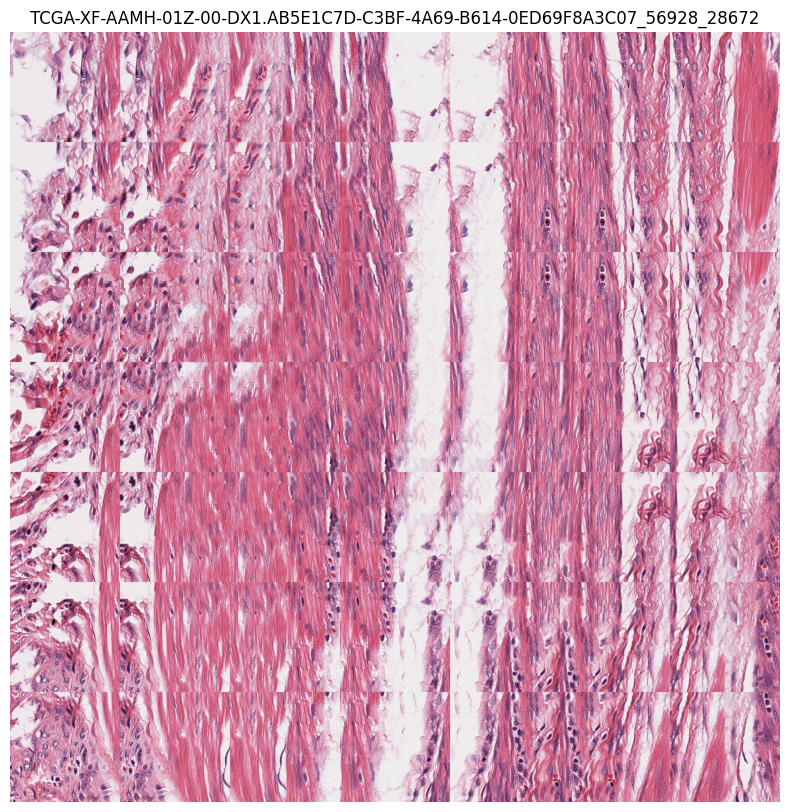

In [4]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt

# 设置完整 base 名
full_base = "TCGA-XF-AAMH-01Z-00-DX1.AB5E1C7D-C3BF-4A69-B614-0ED69F8A3C07_56928_28672"

# 提取 base_row 和 base_col
base_name_parts = full_base.split("_")
base_name = "_".join(base_name_parts[:-2])
base_row = int(base_name_parts[-2])
base_col = int(base_name_parts[-1])

# 设置参数
stride = 256
patch_size = 512
rows, cols = 7, 7
image_dir = "/data07/shared/xxu/cvpr/may07/data_2k/patches_from_jsonl/images_512"

# 拼图
row_images = []
for r in range(rows):
    row_patches = []
    for c in range(cols):
        r_offset = r * stride
        c_offset = c * stride
        fname = f"{base_name}_{base_row}_{base_col}_r{r_offset}_c{c_offset}.png"
        path = os.path.join(image_dir, fname)

        if not os.path.exists(path):
            print(f"Missing: {path}")
            patch = np.zeros((patch_size, patch_size, 3), dtype=np.uint8)
        else:
            patch = cv2.imread(path)
            patch = cv2.cvtColor(patch, cv2.COLOR_BGR2RGB)

        row_patches.append(patch)
    row_images.append(np.hstack(row_patches))

# 显示整图
full_image = np.vstack(row_images)
plt.figure(figsize=(10, 10))
plt.imshow(full_image)
plt.axis("off")
plt.title(full_base)
plt.show()


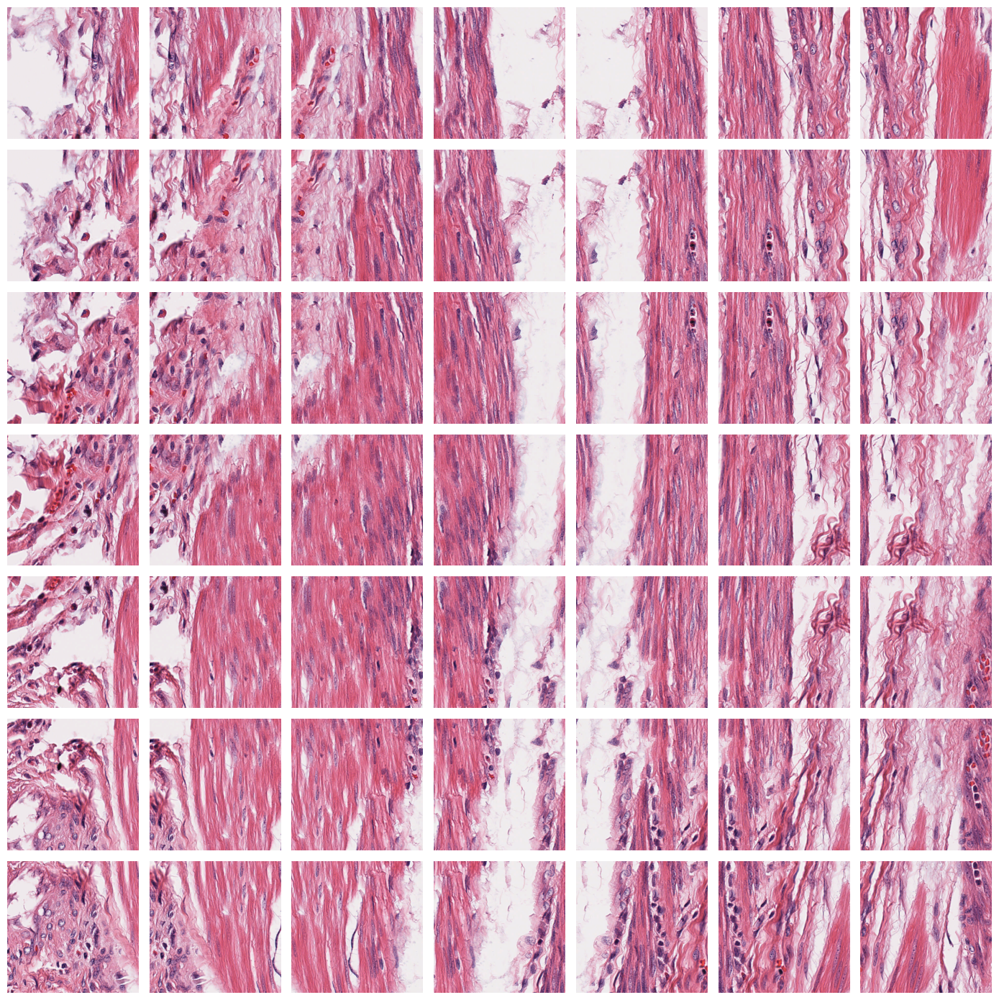

In [3]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt

# 设置完整 base name
full_base = "TCGA-XF-AAMH-01Z-00-DX1.AB5E1C7D-C3BF-4A69-B614-0ED69F8A3C07_56928_28672"

# 提取信息
parts = full_base.split("_")
base_name = "_".join(parts[:-2])
base_row = int(parts[-2])
base_col = int(parts[-1])

# 参数
stride = 256
rows, cols = 7, 7
patch_size = 512
image_dir = "/data07/shared/xxu/cvpr/may07/data_2k/patches_from_jsonl/images_512"

# 创建子图
fig, axs = plt.subplots(rows, cols, figsize=(cols * 2, rows * 2))

for r in range(rows):
    for c in range(cols):
        r_offset = r * stride
        c_offset = c * stride
        fname = f"{base_name}_{base_row}_{base_col}_r{r_offset}_c{c_offset}.png"
        path = os.path.join(image_dir, fname)

        if not os.path.exists(path):
            img = np.zeros((patch_size, patch_size, 3), dtype=np.uint8)
            print(f"Missing: {path}")
        else:
            img = cv2.imread(path)
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        axs[r, c].imshow(img)
        # axs[r, c].set_title(f"r{r_offset}_c{c_offset}", fontsize=8)
        axs[r, c].axis("off")

plt.tight_layout()
# plt.suptitle(full_base, fontsize=12)
plt.show()


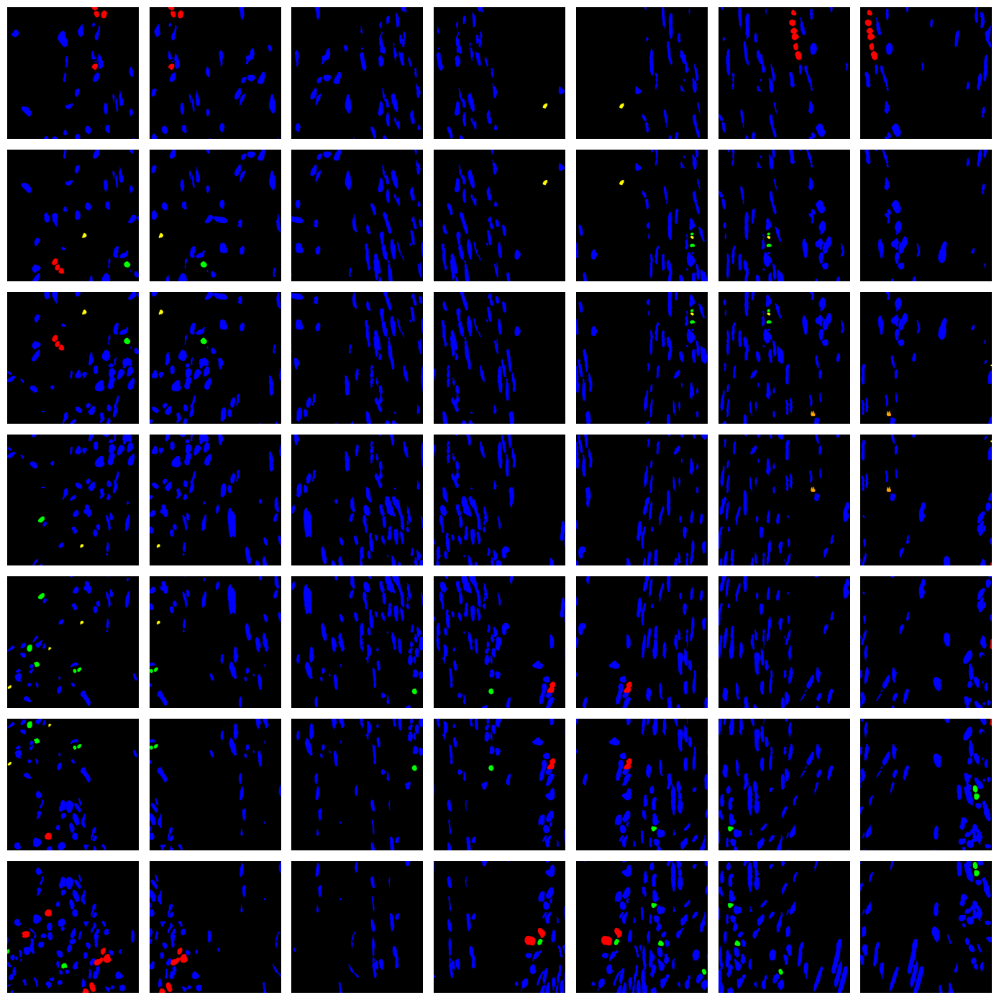

In [9]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt

# 设置完整 base name
full_base = "TCGA-XF-AAMH-01Z-00-DX1.AB5E1C7D-C3BF-4A69-B614-0ED69F8A3C07_56928_28672"

# 提取信息
parts = full_base.split("_")
base_name = "_".join(parts[:-2])
base_row = int(parts[-2])
base_col = int(parts[-1])

# 参数
stride = 256
rows, cols = 7, 7
patch_size = 512
image_dir = "/data07/shared/xxu/cvpr/may07/data_2k/patches_from_jsonl/nuclei_512"

# 创建子图
fig, axs = plt.subplots(rows, cols, figsize=(cols * 2, rows * 2))

for r in range(rows):
    for c in range(cols):
        r_offset = r * stride
        c_offset = c * stride
        fname = f"{base_name}_{base_row}_{base_col}_r{r_offset}_c{c_offset}.png"
        path = os.path.join(image_dir, fname)

        if not os.path.exists(path):
            img = np.zeros((patch_size, patch_size, 3), dtype=np.uint8)
            print(f"Missing: {path}")
        else:
            img = cv2.imread(path)
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        axs[r, c].imshow(img)
        # axs[r, c].set_title(f"r{r_offset}_c{c_offset}", fontsize=8)
        axs[r, c].axis("off")

plt.tight_layout()
# plt.suptitle(full_base, fontsize=12)
plt.show()

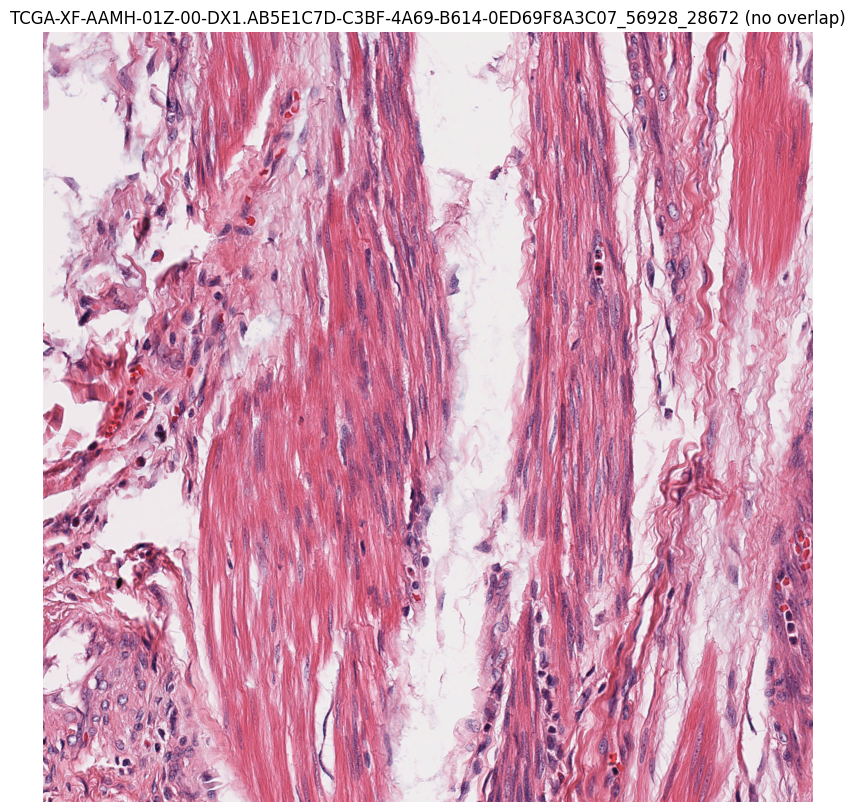

In [1]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt

# 设置完整 base name
full_base = "TCGA-XF-AAMH-01Z-00-DX1.AB5E1C7D-C3BF-4A69-B614-0ED69F8A3C07_56928_28672"
parts = full_base.split("_")
base_name = "_".join(parts[:-2])
base_row = int(parts[-2])
base_col = int(parts[-1])

# Patch 参数
patch_size = 512
stride = 256
rows, cols = 7, 7
image_dir = "/data07/shared/xxu/cvpr/may07/data_2k/patches_from_jsonl/images_512"

# 动态裁剪非重叠区域
def crop_patch(patch, r_idx, c_idx, max_r, max_c):
    top = 0 if r_idx == 0 else 128
    bottom = patch_size if r_idx == max_r else 384
    left = 0 if c_idx == 0 else 128
    right = patch_size if c_idx == max_c else 384
    return patch[top:bottom, left:right]

# 拼接图像
row_images = []
for r in range(rows):
    row_patches = []
    for c in range(cols):
        r_off = r * stride
        c_off = c * stride
        fname = f"{base_name}_{base_row}_{base_col}_r{r_off}_c{c_off}.png"
        path = os.path.join(image_dir, fname)

        if not os.path.exists(path):
            print(f"Missing patch: {path}")
            patch = np.zeros((patch_size, patch_size, 3), dtype=np.uint8)
        else:
            patch = cv2.imread(path)
            patch = cv2.cvtColor(patch, cv2.COLOR_BGR2RGB)

        patch_cropped = crop_patch(patch, r, c, rows - 1, cols - 1)
        row_patches.append(patch_cropped)
    row_images.append(np.hstack(row_patches))

# 最终图像
final_image = np.vstack(row_images)

# 显示
plt.figure(figsize=(10, 10))
plt.imshow(final_image)
plt.axis("off")
plt.title(f"{full_base} (no overlap)")
plt.show()


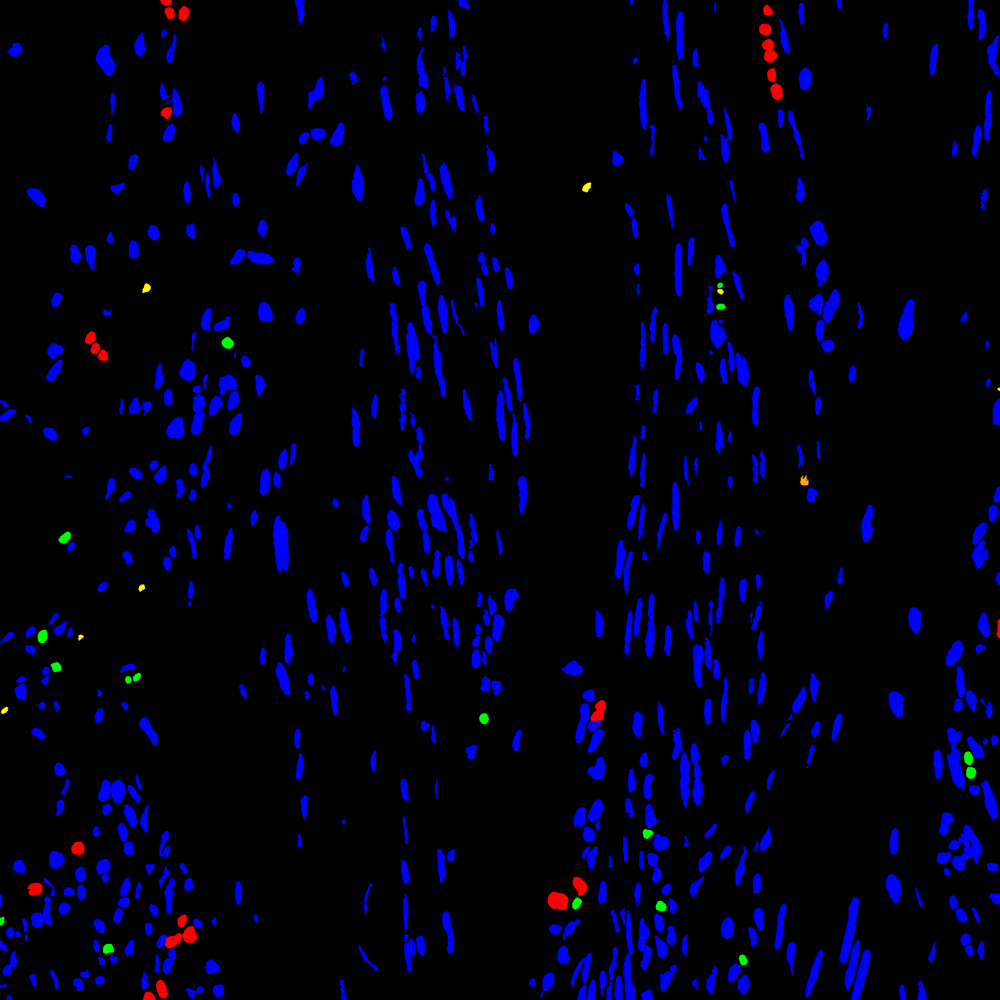

In [2]:
from PIL import Image
cond = Image.open('/data07/shared/xxu/cvpr/may07/pathgen/pathgen_2k_hovernet_pannuke/TCGA-XF-AAMH-01Z-00-DX1.AB5E1C7D-C3BF-4A69-B614-0ED69F8A3C07_56928_28672.png')
cond

In [5]:
with open("/data07/shared/xxu/cvpr/may07/data_2k/patches_from_jsonl/prompts/TCGA-XF-AAMH-01Z-00-DX1.AB5E1C7D-C3BF-4A69-B614-0ED69F8A3C07_56928_28672_r0_c0.txt", "r") as f:
    lines = f.readlines()

# 去除换行符
lines = [line.strip() for line in lines]

In [6]:
lines

['The tissue image displays disorganized, spindle-shaped smooth muscle cells with elongated nuclei and eosinophilic cytoplasm. Variations in staining indicate interspersed connective tissue. The irregular architecture suggests a possible pathological alteration. Definitive diagnosis requires further clinical and histological context, including specific staining methods.']